# **Network Stock Portfolio Optimization**

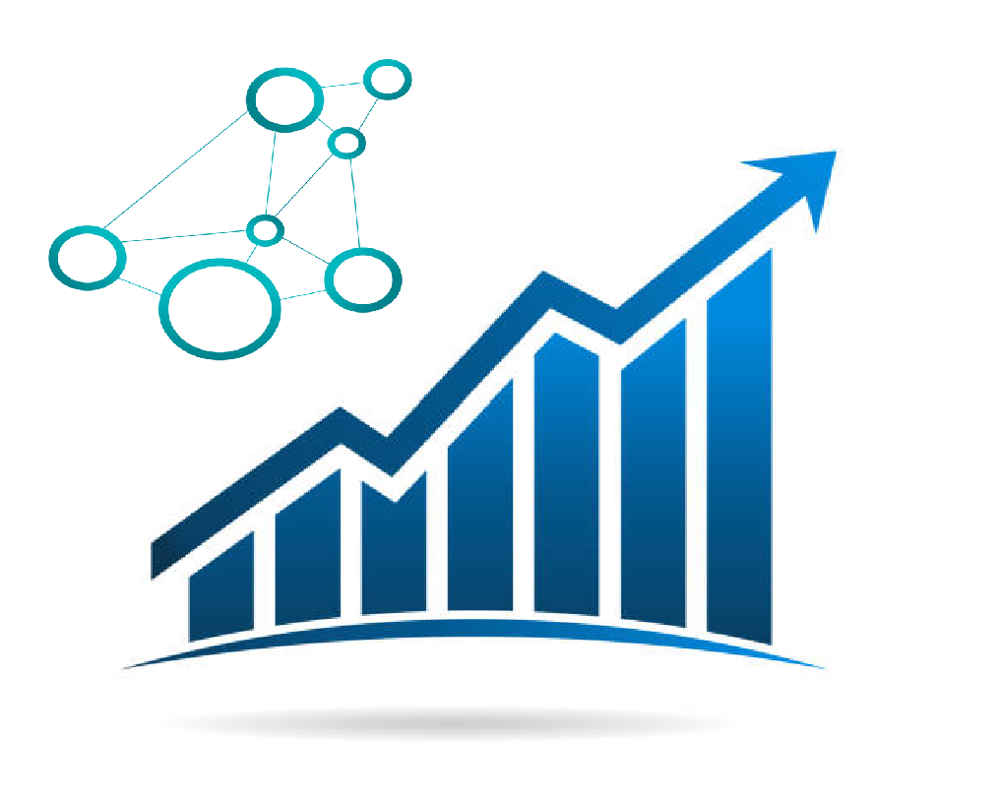

## **Context and Problem Statement**

Imagine you're a curious investor, not just content with riding the market’s waves, but aiming to surf ahead of them. You're not here to follow the herd, you're here to outperform it. That’s exactly the spirit of **active investing** (and it's the heart of what we are doing in this work).

In the world of asset management, active investing is a strategy where portfolio managers strive to beat the average **market return**. They typically choose a benchmark index to compare against something like the **S&P 500**, one of the most followed indices in the world. The S&P 500 represents the 500 largest **publicly traded companies in the United States**, covering giants like Apple, Microsoft, Amazon, and Google’s parent company Alphabet. It spans diverse sectors: tech, energy, healthcare, consumer goods; and is often seen as a proxy for the entire U.S. stock market.

**But what if you wanted to do better than the S&P 500?**

That’s where things get interesting.

Unlike passive investing, where your portfolio simply mimics the index (buying all 500 stocks in their respective weights), active investing means making informed decisions: when to buy, when to sell, and most importantly, what to buy in the first place. It’s about selecting stocks you believe will perform better than the average.

But here’s a twist: how to do that? Good question. There is a lot of techniques to achieve this goal that relies on some mathematical concepts (yes, the person who made you think that maths are useless outside the school is a big liar). Here, we'll use a very interesting branch of mathematics: **graph theory** a branch used in network science, social analysis, and even internet architecture.

That’s the journey we’re about to take.

In this project, we’ll use network analysis to build two portfolios from the S&P 500 stock universe. We’ll analyze the relationships between stocks like a network of interconnected nodes, selecting a basket of stocks that are structurally diverse and potentially high-performing. Then, we'll simulate investing a fixed amount into each portfolio, holding them for a full year, and see how they stack up against the S&P 500 itself.

Will our graph-based strategy outperform the market? Let’s find out together.

In this project we will try to follow the approach mentioned in the below research paper:

**[Dynamic portfolio strategy using a clustering
approach](https://arxiv.org/pdf/1608.03058.pdf)**

**Note that this work is primarily focused on data analysis and should not be interpreted as investment advice. We simply explore the data and draw conclusions on a specific topic.**

## **Proposed Approach**

On collected price data for all S&P 500 components from 2011 till 2020 (don't worry, we'll discuss about all of the weird terms that appear here):
- Compute **log returns** for the S&P 500 components for same time period
- Compute the **correlation matrix** for the above log returns
- Find out the **Top n central and peripheral stocks** based on the following network topological parameters:
    - Degree centrality
    - Betweenness centrality
    - Distance on degree criterion
    - Distance on correlation criterion
    - Distance on distance criterion
- Simulate the performance of central and peripheral portfolios against the performance of S&P 500 for the year 2021    

It can be useful to look for more data, but we prefer to limit our analysis to this scope first.

## **Loading the Libraries**

For most of the projetcs made by using Python, we need to import some necessary libraries that help for some advanced functions

We will need to first install the library - `pandas_datareader` using `!pip install pandas_datareader`

In [1]:
# Libraries imports and their purpose:
import tqdm # Progress bars for loops (great for tracking downloads or computations)

import requests  # For sending HTTP requests (e.g. to retrieve web data or APIs)

import numpy as np  # Numerical operations (arrays, math functions)

import pandas as pd  # Data manipulation and tabular analysis (DataFrames)

import seaborn as sns  # Statistical data visualization (built on top of matplotlib)

import networkx as nx  # Building and analyzing graph/network structures

import plotly.express as px # Interactive visualizations (great for dashboards and web apps)

from bs4 import BeautifulSoup # Parsing HTML and web scraping

import matplotlib.pyplot as plt # Core plotting library for static visualizations

import pandas_datareader.data as web # Accessing financial market data from online sources (e.g. Yahoo Finance)

import warnings
warnings.filterwarnings('ignore')

## **Getting the S&P 500 Components**

S&P 500 stands for Standard & Poor (from the company which created the index). The stocks used for this index come from companies that are chosen for their size, liquidity and importance in the economy. The index is regularly updated in terms of companies, no one's place is secure.

## **Price Data for all the S&P 500 components between 2011 and 2020**

In [2]:
price_data = pd.read_csv('snp500_price_data_2011_to_2020.csv', index_col=[0]) # loading collected data

In [3]:
price_data.head()

,MMM,AOS,ABT,ABBV,ABMD,ACN,ATVI,ADM,ADBE,ADP,...,XEL,XLNX,XYL,YUM,ZBRA,ZBH,ZION,ZTS,CEG,OGN
Date,,,,,,,,,,,,,,,,,,,,,
2010-12-31,63.855606,8.113162,17.986767,NaN,9.61,39.143620,11.245819,22.385578,30.780001,31.271172,...,16.221039,23.216919,NaN,28.547478,37.990002,49.212429,21.089169,NaN,NaN,NaN
2011-01-03,64.218163,8.125947,17.952976,NaN,9.80,39.224346,11.318138,22.623722,31.290001,31.791464,...,16.227924,23.569420,NaN,28.570745,38.200001,50.395058,21.907326,NaN,NaN,NaN
2011-01-04,64.129395,8.100383,18.121916,NaN,9.80,38.966022,11.327178,22.608845,31.510000,31.676586,...,16.296804,23.665552,NaN,28.134232,37.840000,49.725819,21.550467,NaN,NaN,NaN
2011-01-05,64.129395,8.285738,18.121916,NaN,10.03,38.974094,11.110217,22.713020,32.220001,32.183357,...,16.200367,23.745670,NaN,28.268110,37.799999,49.762482,21.672325,NaN,NaN,NaN
2011-01-06,63.737186,8.289999,18.084377,NaN,10.05,39.119389,11.083097,23.583750,32.270000,32.433369,...,16.186602,24.146229,NaN,28.465996,37.480000,48.222305,21.611391,NaN,NaN,NaN


In [4]:
price_data.tail()

,MMM,AOS,ABT,ABBV,ABMD,ACN,ATVI,ADM,ADBE,ADP,...,XEL,XLNX,XYL,YUM,ZBRA,ZBH,ZION,ZTS,CEG,OGN
Date,,,,,,,,,,,,,,,,,,,,,
2020-12-24,169.150864,54.346931,106.325676,97.521835,303.410004,253.501236,90.521706,48.271740,499.859985,173.268692,...,62.861969,141.990005,99.302414,105.767082,376.890015,148.288040,42.802708,159.582993,NaN,NaN
2020-12-28,169.335022,54.484066,105.776146,97.701271,312.910004,255.846100,90.989441,48.525593,498.950012,173.317749,...,63.533100,141.520004,99.421288,107.970161,382.589996,147.930344,42.822460,161.241150,NaN,NaN
2020-12-29,168.501480,53.592655,106.306061,98.881805,320.929993,253.954453,90.929733,48.281498,502.109985,171.610199,...,63.630352,139.899994,98.569412,107.645592,378.040009,151.467392,42.239773,161.966003,NaN,NaN
2020-12-30,168.753479,53.592655,106.414001,99.420128,323.920013,253.737732,91.138718,48.730629,497.450012,170.569962,...,63.854065,142.100006,99.827408,107.704605,383.750000,151.238892,42.684193,163.107880,NaN,NaN
2020-12-31,169.412552,53.700409,107.444366,101.195663,324.200012,257.353546,92.402596,49.218815,500.119995,172.915421,...,64.846161,141.770004,100.827866,106.770256,384.329987,153.096832,42.901466,164.329178,NaN,NaN


We note that we have a lot of columns in our dataset; but what are they about ? Yeah you probably got it, the columns are stocks tickers and the rows are stocks prices at a defined date.  
**Tickers ?** Yes! A ticker is a little code that identify a stock from a publicly traded company (**TSLA** for Tesla, **MS** for Morgan Stanley, **PRUD** for Prudential…). So, in this dataset, you have S&P 500 stocks identifiers, and their prices from 2010–12–31 to 2020–12–31

In [5]:
# the index are the dates
price_data.index

Index(['2010-12-31', '2011-01-03', '2011-01-04', '2011-01-05', '2011-01-06',
       '2011-01-07', '2011-01-10', '2011-01-11', '2011-01-12', '2011-01-13',
       ...
       '2020-12-17', '2020-12-18', '2020-12-21', '2020-12-22', '2020-12-23',
       '2020-12-24', '2020-12-28', '2020-12-29', '2020-12-30', '2020-12-31'],
      dtype='object', name='Date', length=2518)

It's always a good move to get to know your data. In this section we are interested in the structure of the dataset and the types in our dataframe. This allows us to know if we need some transformations on data.

In [6]:
price_data.shape

(2518, 505)

In [7]:
price_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2518 entries, 2010-12-31 to 2020-12-31
Columns: 505 entries, MMM to OGN
dtypes: float64(505)
memory usage: 9.7+ MB


Lucky us, we're only dealing with floats! (Makes sense, they're prices after all.) That's great because it lets us jump straight into the real problem we need to solve.

## **Missing Data due to Index Rebalancing**

Now let's deal with missing data

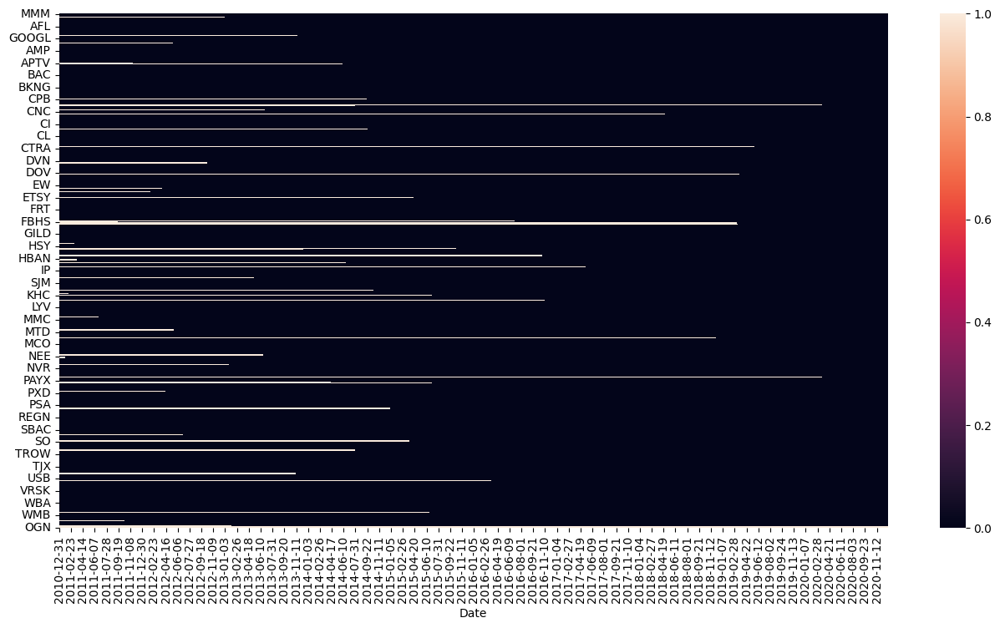

In [8]:
figure = plt.figure(figsize=(16, 8))
sns.heatmap(price_data.T.isnull());

The white lines indicate the **missing values** (NaN or NULL if you prefer). **But, what does it mean?**  

Missing data are not always caused by randomness or measurement errors. In this case, they simply reflect the fact that some stocks enter or leave the S&P 500 over time. Remember, the index gets updated regularly!  

For this work, we want to keep things clean and consistent, so we'll focus only on the stocks that remained in the index throughout the entire time period.  

I know… you're probably thinking of clever ways to treat missing data as useful information-and you're totally right. That could be a fun project for another day.

In [9]:
price_data_cleaned = price_data.dropna(axis=1) # dropping na values columnwise

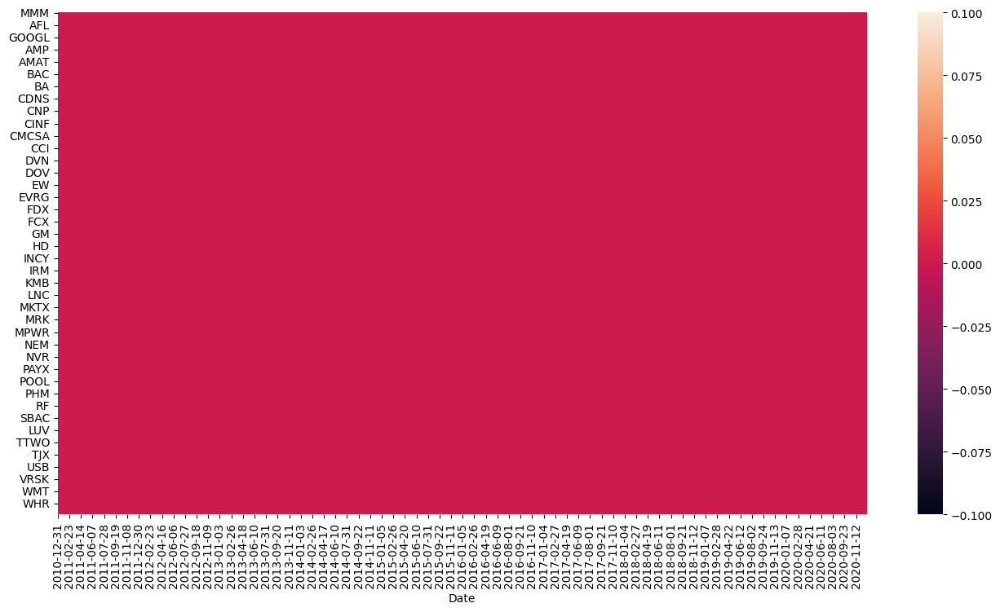

In [10]:
figure = plt.figure(figsize=(16, 8))
sns.heatmap(price_data_cleaned.T.isnull());

The null values are removed - the data is clean and the plot also helps in finding that there are no missing values.

In [11]:
# previous data columns
price_data.columns

Index(['MMM', 'AOS', 'ABT', 'ABBV', 'ABMD', 'ACN', 'ATVI', 'ADM', 'ADBE',
       'ADP',
       ...
       'XEL', 'XLNX', 'XYL', 'YUM', 'ZBRA', 'ZBH', 'ZION', 'ZTS', 'CEG',
       'OGN'],
      dtype='object', length=505)

In [12]:
# current data columns: with only the persistents companies accross our scope
price_data_cleaned.columns

Index(['MMM', 'AOS', 'ABT', 'ABMD', 'ACN', 'ATVI', 'ADM', 'ADBE', 'ADP', 'AAP',
       ...
       'WHR', 'WMB', 'WTW', 'WYNN', 'XEL', 'XLNX', 'YUM', 'ZBRA', 'ZBH',
       'ZION'],
      dtype='object', length=450)

## **Getting Yearwise Data**

We’ll start by breaking down our data year by year to spot key trends and important patterns.

In [13]:
def get_year_wise_snp_500_data(data, year):
  """To get data for a particular year in our dataset
data: the dataset that we are sampling
year: the year that we collect in our sample"""
  year_wise_data = data.loc['{}-01-01'.format(year):'{}-12-31'.format(year)]# .loc permits to access by index name

  return year_wise_data

In [14]:
# Getting year wise data of S&P stocks from 2011 to 2020
snp_500_2011 = get_year_wise_snp_500_data(price_data_cleaned, 2011)
snp_500_2012 = get_year_wise_snp_500_data(price_data_cleaned, 2012)
snp_500_2013 = get_year_wise_snp_500_data(price_data_cleaned, 2013)
snp_500_2014 = get_year_wise_snp_500_data(price_data_cleaned, 2014)
snp_500_2015 = get_year_wise_snp_500_data(price_data_cleaned, 2015)
snp_500_2016 = get_year_wise_snp_500_data(price_data_cleaned, 2016)
snp_500_2017 = get_year_wise_snp_500_data(price_data_cleaned, 2017)
snp_500_2018 = get_year_wise_snp_500_data(price_data_cleaned, 2018)
snp_500_2019 = get_year_wise_snp_500_data(price_data_cleaned, 2019)
snp_500_2020 = get_year_wise_snp_500_data(price_data_cleaned, 2020)

In [15]:
snp_500_2011.head()

,MMM,AOS,ABT,ABMD,ACN,ATVI,ADM,ADBE,ADP,AAP,...,WHR,WMB,WTW,WYNN,XEL,XLNX,YUM,ZBRA,ZBH,ZION
Date,,,,,,,,,,,,,,,,,,,,,
2011-01-03,64.218163,8.125947,17.952976,9.80,39.224346,11.318138,22.623722,31.290001,31.791464,62.732765,...,67.926483,11.205445,93.139076,77.632828,16.227924,23.569420,28.570745,38.200001,50.395058,21.907326
2011-01-04,64.129395,8.100383,18.121916,9.80,38.966022,11.327178,22.608845,31.510000,31.676586,59.610516,...,66.950417,11.123855,91.576157,80.054619,16.296804,23.665552,28.134232,37.840000,49.725819,21.550467
2011-01-05,64.129395,8.285738,18.121916,10.03,38.974094,11.110217,22.713020,32.220001,32.183357,59.687115,...,67.400887,11.141987,92.847679,81.087433,16.200367,23.745670,28.268110,37.799999,49.762482,21.672325
2011-01-06,63.737186,8.289999,18.084377,10.05,39.119389,11.083097,23.583750,32.270000,32.433369,57.723724,...,65.966843,11.119320,93.112579,81.678650,16.186602,24.146229,28.465996,37.480000,48.222305,21.611391
2011-01-07,63.803787,8.409311,18.159452,9.89,39.183979,10.938456,23.777237,32.040001,32.507687,59.265705,...,65.689018,11.296103,92.953644,84.570557,16.331245,24.010040,28.821018,37.599998,48.213131,21.385098


Next, we’ll look at the **daily return**. Basically, how much you’d make if you bought a stock in the morning and sold it before the market closes. If you’re an active investor chasing quick moves in the market, this number is definitely one to keep an eye on.  

To compute daily returns, we are using a shifted version of the dataset, since it's a substraction between the value of today and yesterday.

In [16]:
# we shift the data to have the price of the day before in a cell. So that we can compute the daily return
snp_500_2011.shift(1)

,MMM,AOS,ABT,ABMD,ACN,ATVI,ADM,ADBE,ADP,AAP,...,WHR,WMB,WTW,WYNN,XEL,XLNX,YUM,ZBRA,ZBH,ZION
Date,,,,,,,,,,,,,,,,,,,,,
2011-01-03,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2011-01-04,64.218163,8.125947,17.952976,9.800000,39.224346,11.318138,22.623722,31.290001,31.791464,62.732765,...,67.926483,11.205445,93.139076,77.632828,16.227924,23.569420,28.570745,38.200001,50.395058,21.907326
2011-01-05,64.129395,8.100383,18.121916,9.800000,38.966022,11.327178,22.608845,31.510000,31.676586,59.610516,...,66.950417,11.123855,91.576157,80.054619,16.296804,23.665552,28.134232,37.840000,49.725819,21.550467
2011-01-06,64.129395,8.285738,18.121916,10.030000,38.974094,11.110217,22.713020,32.220001,32.183357,59.687115,...,67.400887,11.141987,92.847679,81.087433,16.200367,23.745670,28.268110,37.799999,49.762482,21.672325
2011-01-07,63.737186,8.289999,18.084377,10.050000,39.119389,11.083097,23.583750,32.270000,32.433369,57.723724,...,65.966843,11.119320,93.112579,81.678650,16.186602,24.146229,28.465996,37.480000,48.222305,21.611391
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2011-12-23,61.467400,8.679438,21.677664,18.520000,43.302727,10.920726,21.810799,27.889999,37.444744,66.700890,...,39.094479,15.007899,101.907288,81.066956,19.380699,26.450407,34.675449,36.380001,48.625694,14.085989
2011-12-27,62.401131,8.806977,21.821796,18.469999,43.558022,11.196037,22.084383,28.290001,37.792553,67.537323,...,39.581589,15.226687,103.337746,82.537613,19.524267,26.499556,35.055527,36.520000,48.781536,14.242986
2011-12-28,62.461864,8.845891,21.903597,18.360001,43.590965,11.168506,22.069183,28.500000,37.869064,68.181442,...,36.047947,15.277890,103.761589,85.186325,19.825743,26.450407,35.215870,36.590000,48.845718,14.304041


In [17]:
snp_500_2011

,MMM,AOS,ABT,ABMD,ACN,ATVI,ADM,ADBE,ADP,AAP,...,WHR,WMB,WTW,WYNN,XEL,XLNX,YUM,ZBRA,ZBH,ZION
Date,,,,,,,,,,,,,,,,,,,,,
2011-01-03,64.218163,8.125947,17.952976,9.800000,39.224346,11.318138,22.623722,31.290001,31.791464,62.732765,...,67.926483,11.205445,93.139076,77.632828,16.227924,23.569420,28.570745,38.200001,50.395058,21.907326
2011-01-04,64.129395,8.100383,18.121916,9.800000,38.966022,11.327178,22.608845,31.510000,31.676586,59.610516,...,66.950417,11.123855,91.576157,80.054619,16.296804,23.665552,28.134232,37.840000,49.725819,21.550467
2011-01-05,64.129395,8.285738,18.121916,10.030000,38.974094,11.110217,22.713020,32.220001,32.183357,59.687115,...,67.400887,11.141987,92.847679,81.087433,16.200367,23.745670,28.268110,37.799999,49.762482,21.672325
2011-01-06,63.737186,8.289999,18.084377,10.050000,39.119389,11.083097,23.583750,32.270000,32.433369,57.723724,...,65.966843,11.119320,93.112579,81.678650,16.186602,24.146229,28.465996,37.480000,48.222305,21.611391
2011-01-07,63.803787,8.409311,18.159452,9.890000,39.183979,10.938456,23.777237,32.040001,32.507687,59.265705,...,65.689018,11.296103,92.953644,84.570557,16.331245,24.010040,28.821018,37.599998,48.213131,21.385098
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2011-12-23,62.401131,8.806977,21.821796,18.469999,43.558022,11.196037,22.084383,28.290001,37.792553,67.537323,...,39.581589,15.226687,103.337746,82.537613,19.524267,26.499556,35.055527,36.520000,48.781536,14.242986
2011-12-27,62.461864,8.845891,21.903597,18.360001,43.590965,11.168506,22.069183,28.500000,37.869064,68.181442,...,36.047947,15.277890,103.761589,85.186325,19.825743,26.450407,35.215870,36.590000,48.845718,14.304041
2011-12-28,61.604034,8.612420,21.747778,18.250000,43.533318,11.131798,21.560009,28.020000,37.423878,67.546921,...,35.854633,14.956691,102.516556,81.952354,19.710886,26.188274,35.025822,35.700001,48.735703,14.033657


## **Computing the Daily Log Returns**


"What?" Yes, the log returns. It's just the logarithm of a given daily return. "Why would we do that?" It's common in quantitative finance when we want to deal with returns because it has a lot of adventages.  
**Returns (percentage-based) are not additive**. You can’t just sum daily returns to get the total return over n days. This makes it harder to analyze performance over time if you rely on simple arithmetic. Thankfully, **log returns are additive**, so you can sum them across time, then exponentiate the result to get the actual cumulative return. You can find [here](https://youtu.be/47h5VsGahfc?si=X0A3NY1hubHcrhrL) a pretty cool example to get the idea.

Statistically, **simple stock returns are often assumed to follow a Log Normal distribution**. Why ? Because they evolve exponentially over time, you know, like your money when you let it sleep in an account with compound interest (well, if only). In addition, since the Log Normal distribution is bound by zero on the lower side, it is perfect for modeling asset prices that cannot take negative values. In short, it's a very practical hypothesis, even if reality sometimes likes to make jokes.

Analyzing stock returns is a form of time series analysis.
One key aspect is stationarity, which means that the statistical properties of the series (like mean and variance) remain stable over time.
Using log returns instead of simple percentage returns often helps to achieve stationarity, which is important for many models to work properly.

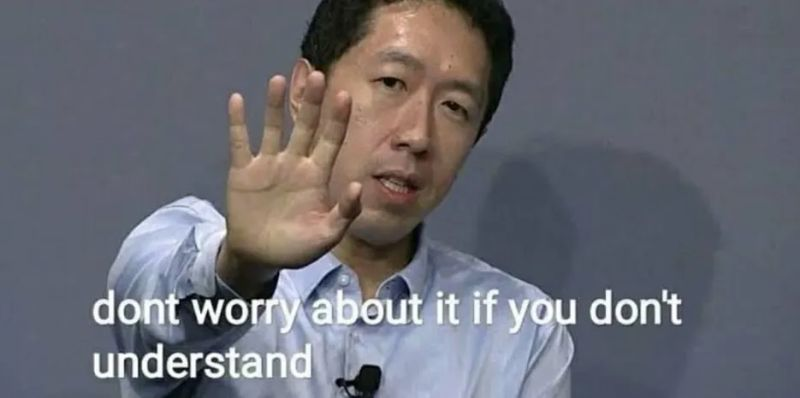

So let's just say that it is common in stocks returns analysis to consider the logs, and it has some benefits

In [18]:
# Calculating daily log returns by subtracting between two days with the help of shift function
# using np.log() to compute the natural logarithm
# by using numpy we can compute it on each entire data structure (thanks to vectorization)
log_returns_2011 = np.log(snp_500_2011.shift(1)) - np.log(snp_500_2011)
log_returns_2012 = np.log(snp_500_2012.shift(1)) - np.log(snp_500_2012)
log_returns_2013 = np.log(snp_500_2013.shift(1)) - np.log(snp_500_2013)
log_returns_2014 = np.log(snp_500_2014.shift(1)) - np.log(snp_500_2014)
log_returns_2015 = np.log(snp_500_2015.shift(1)) - np.log(snp_500_2015)
log_returns_2016 = np.log(snp_500_2016.shift(1)) - np.log(snp_500_2016)
log_returns_2017 = np.log(snp_500_2017.shift(1)) - np.log(snp_500_2017)
log_returns_2018 = np.log(snp_500_2018.shift(1)) - np.log(snp_500_2018)
log_returns_2019 = np.log(snp_500_2019.shift(1)) - np.log(snp_500_2019)
log_returns_2020 = np.log(snp_500_2020.shift(1)) - np.log(snp_500_2020)

In [19]:
log_returns_2011.head()
# the dataframe type remains, even if we used numpy to make calculations. Pandas is designed to be compatible with numpy

,MMM,AOS,ABT,ABMD,ACN,ATVI,ADM,ADBE,ADP,AAP,...,WHR,WMB,WTW,WYNN,XEL,XLNX,YUM,ZBRA,ZBH,ZION
Date,,,,,,,,,,,,,,,,,,,,,
2011-01-03,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2011-01-04,0.001383,0.003151,-0.009366,0.000000,0.006608,-0.000798,0.000658,-0.007006,0.003620,0.051052,...,0.014474,0.007308,0.016923,-0.030719,-0.004236,-0.004070,0.015396,0.009469,0.013369,0.016424
2011-01-05,0.000000,-0.022624,0.000000,-0.023198,-0.000207,0.019340,-0.004597,-0.022282,-0.015872,-0.001284,...,-0.006706,-0.001629,-0.013789,-0.012819,0.005935,-0.003380,-0.004747,0.001058,-0.000737,-0.005639
2011-01-06,0.006135,-0.000514,0.002074,-0.001992,-0.003721,0.002444,-0.037620,-0.001551,-0.007738,0.033448,...,0.021506,0.002036,-0.002849,-0.007265,0.000850,-0.016728,-0.006976,0.008502,0.031440,0.002816
2011-01-07,-0.001044,-0.014290,-0.004143,0.016048,-0.001650,0.013137,-0.008171,0.007153,-0.002289,-0.026363,...,0.004220,-0.015774,0.001708,-0.034794,-0.008896,0.005656,-0.012395,-0.003197,0.000190,0.010526


## **Computing the Correlation of Returns**

In this section, we will compute correlations between stocks. In simple words, how stocks are growing together (positively or negatively or independently).

In [20]:
# Computing correlations matrices:
# the .corr() function helps us to compute the Pearson correlation on numerical values in a pandas dataframe
return_correlation_2011 = log_returns_2011.corr()
return_correlation_2012 = log_returns_2012.corr()
return_correlation_2013 = log_returns_2013.corr()
return_correlation_2014 = log_returns_2014.corr()
return_correlation_2015 = log_returns_2015.corr()
return_correlation_2016 = log_returns_2016.corr()
return_correlation_2017 = log_returns_2017.corr()
return_correlation_2018 = log_returns_2018.corr()
return_correlation_2019 = log_returns_2019.corr()
return_correlation_2020 = log_returns_2020.corr()

In [21]:
return_correlation_2011.head()

,MMM,AOS,ABT,ABMD,ACN,ATVI,ADM,ADBE,ADP,AAP,...,WHR,WMB,WTW,WYNN,XEL,XLNX,YUM,ZBRA,ZBH,ZION
MMM,1.000000,0.744452,0.652211,0.532197,0.667245,0.532282,0.746453,0.670923,0.794108,0.484388,...,0.636695,0.689527,0.651525,0.653595,0.672967,0.621883,0.617876,0.732709,0.663241,0.776753
AOS,0.744452,1.000000,0.539764,0.578904,0.664513,0.510653,0.704257,0.698128,0.733497,0.470275,...,0.608337,0.645600,0.590829,0.617461,0.590431,0.619158,0.587679,0.687938,0.619131,0.703531
ABT,0.652211,0.539764,1.000000,0.493901,0.579427,0.486626,0.599847,0.526351,0.731304,0.455865,...,0.506784,0.532347,0.460250,0.442601,0.707133,0.404031,0.570444,0.559770,0.613580,0.540583
ABMD,0.532197,0.578904,0.493901,1.000000,0.520047,0.333723,0.535969,0.489011,0.564425,0.391989,...,0.471003,0.532668,0.411610,0.462857,0.444125,0.447241,0.441934,0.592206,0.434013,0.524477
ACN,0.667245,0.664513,0.579427,0.520047,1.000000,0.505992,0.649773,0.624144,0.733336,0.386687,...,0.534776,0.651979,0.518265,0.597383,0.567191,0.582964,0.569241,0.707605,0.601504,0.637783


Let's now plot the correlations for each year:  

To do this, we're going to use heatmaps. Each heatmap occupies a position i,j in our graph. The heatmap for the year 2011 occupies position 0.0 and will be at the top left of the graph, the year 2012 occupies position 0.1 and will be at the top right, the year 2013 occupies position 1.0 and so on. Next to it is a gauge that allows you to interpret the correlations thanks to the heatmap colors.

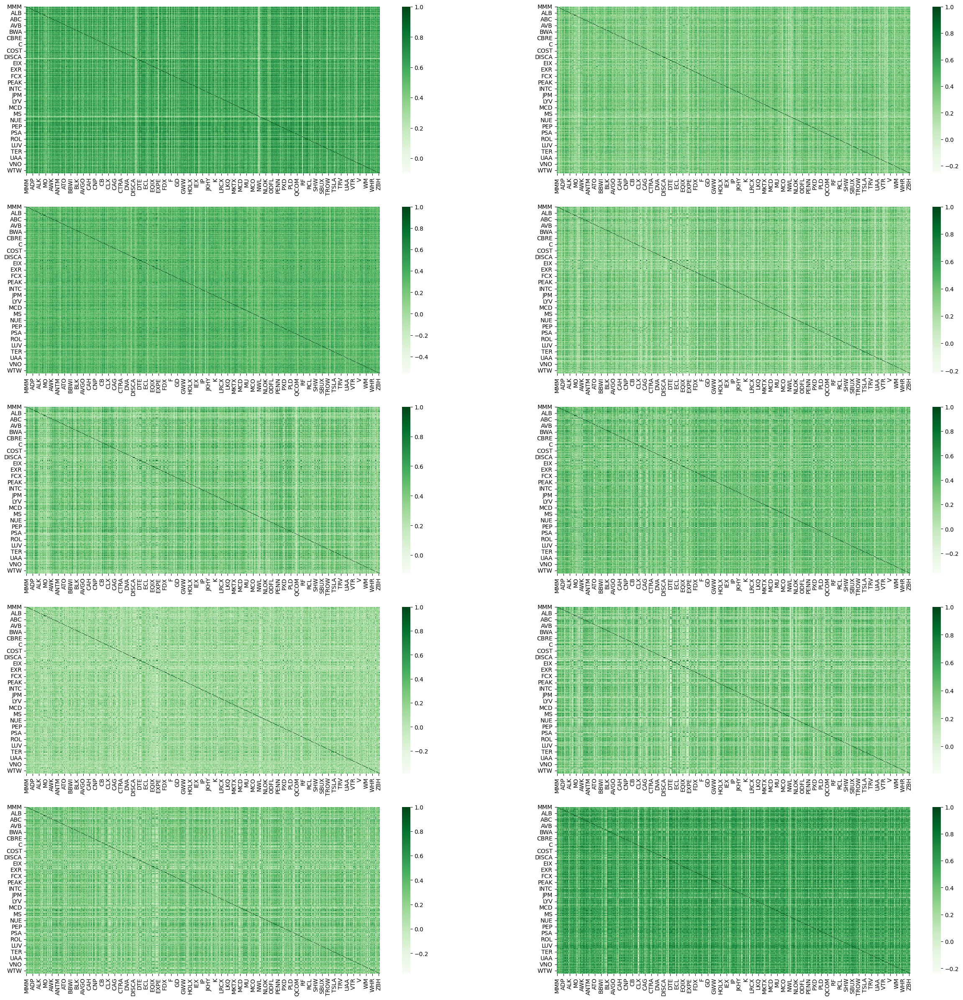

In [22]:
figure, axes = plt.subplots(5, 2, figsize=(30, 30))
# for each year you have a plot. The axes[i,j] define the position of the plot in the output
# we are plotting one heatmap for each correlation matrix (one per year)
# the heatmap allows us to visualize the correlations
sns.heatmap(return_correlation_2011, ax=axes[0, 0], cmap='Greens');
sns.heatmap(return_correlation_2012, ax=axes[0, 1], cmap='Greens');
sns.heatmap(return_correlation_2013, ax=axes[1, 0], cmap='Greens');
sns.heatmap(return_correlation_2014, ax=axes[1, 1], cmap='Greens');
sns.heatmap(return_correlation_2015, ax=axes[2, 0], cmap='Greens');
sns.heatmap(return_correlation_2016, ax=axes[2, 1], cmap='Greens');
sns.heatmap(return_correlation_2017, ax=axes[3, 0], cmap='Greens');
sns.heatmap(return_correlation_2018, ax=axes[3, 1], cmap='Greens');
sns.heatmap(return_correlation_2019, ax=axes[4, 0], cmap='Greens');
sns.heatmap(return_correlation_2020, ax=axes[4, 1], cmap='Greens');

## **Inferences**

Take a look at our first plot from 2011. You'll notice a high correlation between the stocks. Why? Because 2011 was a wild ride (eurozone debt crisis shook global markets, and even the U.S. lost its AAA credit rating). There was a market crash and a whole lot of volatility. When panic hits the market, most stocks start moving together, either crashing down or bouncing back up in sync. That’s the magic (or chaos) behind high correlation during unstable times.

Fast forward to 2012, 2014, and 2017. What do we see? Calm waters. The markets were relatively stable, and when things are chill, stocks tend to do their own thing. That’s why the correlation between them is low during these years. They're like polite roommates, not interfering too much with each other.

Now let’s talk about 2020. Ah yes, the year of COVID. The pandemic shook the world, and the market didn’t stay immune. Stocks moved together again, reacting sharply to global uncertainty. Whether diving or spiking, they followed the same rhythm. Result? High correlation, just like in 2011.

From this we can infer that, **In stable market conditions, correlation matrices have low correlation values whereas in critical market conditions, correlation matrices have high correlation values.**

## **Creating Graphs**

The moment some of you have been waiting for has finally arrived... we are finally going to plot the graph.

When we say “**graph**” here, we’re not talking about bar charts or line plots. We’re diving into the world of network science and graph theory, where a graph is a powerful mathematical structure used to represent connections.

Think of it as a social network; but instead of friends and followers, we have:



*   **Nodes (a.k.a. vertices)**: These are the points or dots in the graph. Each node usually represents an entity: a company, a person, or a stock. In our case, **each stock in the S&P 500 could be a node**.
*   **Edges (a.k.a. links or connections)**: These are the lines that connect nodes. An edge/a connection tells us that two nodes are **related** somehow. Maybe they’re correlated, maybe they trade together, maybe they follow similar patterns.  If Apple and Microsoft move similarly in the stock market, we might **draw a connection between them**. Sometimes connections have weights, that measures the **cost** of the connection.  

A graph can be directed or undirected. In finance, we often use undirected graphs when modeling correlations or distances, since they’re mutual.


*   **Path**: A path is a sequence of edges that takes you from one node to another. It’s like hopping from one friend to another on Facebook until you reach your target. Why does this matter? Because analyzing the structure of paths in a stock network can tell us how interconnected or influential certain assets are.


**Some words about loops**: A loop is when a node connects to itself. In most practical networks, we don’t use loops, because a stock being correlated with itself isn’t very informative, that’s always 100%.


You can find more informations [here](https://www.geeksforgeeks.org/maths/mathematics-graph-theory-basics-set-1/)


A little illustration of an unweighted undirected graph:

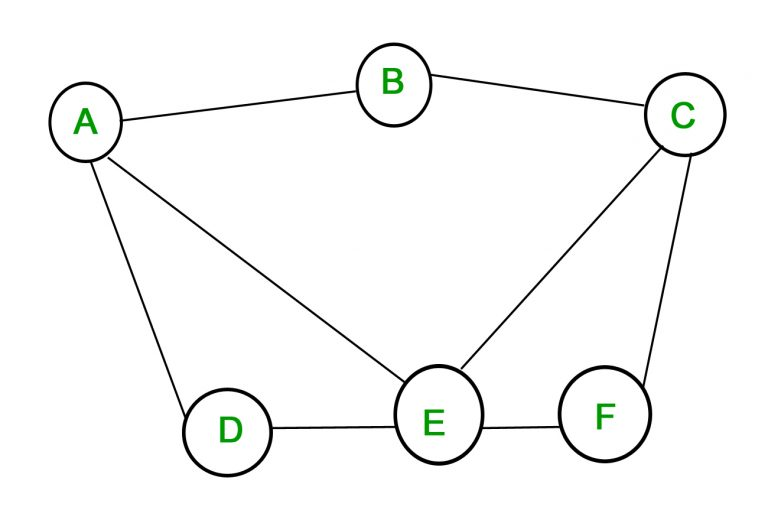

A, B, C, D, E and F are the nodes; we have 8 connections or edges; and a path from A to F is A-B-C-F but also A-E-F

In [23]:
# with networkx as nx we are creating a non oriented graph based on our log returns correlations
graph_2011 = nx.Graph(return_correlation_2011) # the graph for 2011

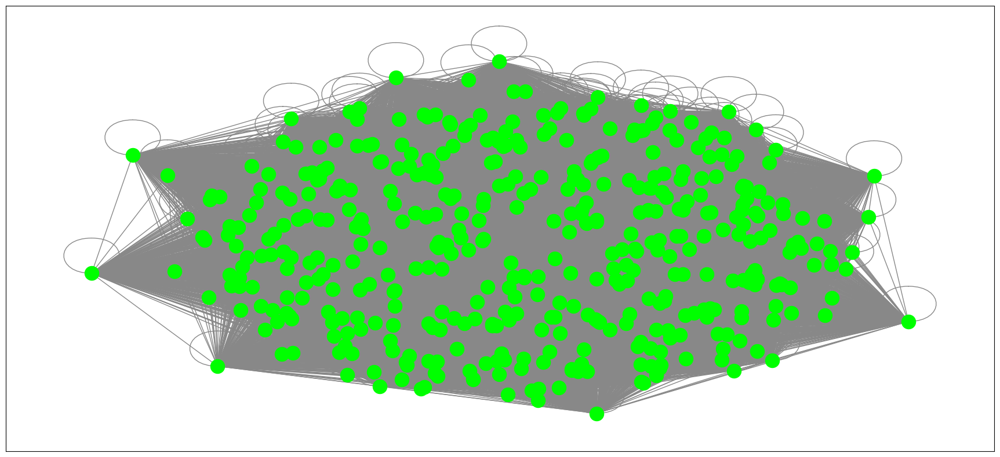

In [24]:
# plotting the graph
figure = plt.figure(figsize=(22, 10)) # we define the figure size
nx.draw_networkx(graph_2011, with_labels=False, node_color='#00ff00', edge_color='#888888') # draw the network with nodes and edges

This is a **fully connected network** as we created it using the correlation matrix.

A fully connected network means that each node has connections with all the other nodes in the network and will also have self-loops. Deep Learning practitioners, I have seen your smiles...

## **Filtering Graphs using MST**

Now we have a fully connected network, but it's not the most efficient way to achieve our goal (surpass the S&P 500 index). Thus, we'll try to keep only the most relevant connections in our network, so that we keep a simplified map of the market that link stocks without self loops and by **minimizing the distance** between the stocks.

**MST - Minimum Spanning Tree**

How to keep this simplified map ? Let's compute the **Minimum Spanning Tree**  
"Wait! The what?"  
A minimum spanning tree (MST) or minimum weight spanning tree is a subset of the edges of a connected, edge-weighted undirected graph that connects all the vertices together, without any cycles and with the minimum possible total edge weight.  

In other terms, it is a spanning tree whose sum of edge weights is as small as possible.

**MST** is one of the popular techniques to eliminate the redundancies and noise and meanwhile maintain the significant links in the network.

While removing redundancy and noise in the data using MST, we might lose some information as well.

You can find more on MST [here](https://visualgo.net/en/mst)

Let's define a distance based on correlations, that tries to **keep close the most positively correlated nodes**:

In [25]:
# we talked about "minimizing the distance".
# So, let's define a distance that tends to keep close the most positively correlated nodes and
# that tends to keep uncorrelated or negatively correlated nodes away from each other
# thus the nodes that will be close to each other are those that have similar log returns
distance_2011 = np.sqrt(2 * (1 - return_correlation_2011)) #sqrt is for square root
distance_2012 = np.sqrt(2 * (1 - return_correlation_2012))
distance_2013 = np.sqrt(2 * (1 - return_correlation_2013))
distance_2014 = np.sqrt(2 * (1 - return_correlation_2014))
distance_2015 = np.sqrt(2 * (1 - return_correlation_2015))
distance_2016 = np.sqrt(2 * (1 - return_correlation_2016))
distance_2017 = np.sqrt(2 * (1 - return_correlation_2017))
distance_2018 = np.sqrt(2 * (1 - return_correlation_2018))
distance_2019 = np.sqrt(2 * (1 - return_correlation_2019))
distance_2020 = np.sqrt(2 * (1 - return_correlation_2020))

Before the construction of the MST graph, **the correlation coefficient is converted into a distance.**

In [26]:
distance_2011_graph = nx.Graph(distance_2011)
distance_2012_graph = nx.Graph(distance_2012)
distance_2013_graph = nx.Graph(distance_2013)
distance_2014_graph = nx.Graph(distance_2014)
distance_2015_graph = nx.Graph(distance_2015)
distance_2016_graph = nx.Graph(distance_2016)
distance_2017_graph = nx.Graph(distance_2017)
distance_2018_graph = nx.Graph(distance_2018)
distance_2019_graph = nx.Graph(distance_2019)
distance_2020_graph = nx.Graph(distance_2020)

In [27]:
# compute minimum spanning tree for each year
graph_2011_filtered = nx.minimum_spanning_tree(distance_2011_graph)
graph_2012_filtered = nx.minimum_spanning_tree(distance_2012_graph)
graph_2013_filtered = nx.minimum_spanning_tree(distance_2013_graph)
graph_2014_filtered = nx.minimum_spanning_tree(distance_2014_graph)
graph_2015_filtered = nx.minimum_spanning_tree(distance_2015_graph)
graph_2016_filtered = nx.minimum_spanning_tree(distance_2016_graph)
graph_2017_filtered = nx.minimum_spanning_tree(distance_2017_graph)
graph_2018_filtered = nx.minimum_spanning_tree(distance_2018_graph)
graph_2019_filtered = nx.minimum_spanning_tree(distance_2019_graph)
graph_2020_filtered = nx.minimum_spanning_tree(distance_2020_graph)

In [28]:
# you can see the difference for the year 2011. Here we show the original number of nodes and edges
print(f"The 2011 network has {graph_2011.number_of_nodes()} nodes and {graph_2011.number_of_edges()} edges.")

The 2011 network has 450 nodes and 101475 edges.


In [29]:
# and now the same characteristics on the Minimum Spanning Tree
print(f"The 2011 filterd network has {graph_2011_filtered.number_of_nodes()} nodes and {graph_2011_filtered.number_of_edges()} edges.")

The 2011 filterd network has 450 nodes and 449 edges.


We choose the MST method to filter out the network graph in each window so as to eliminate the redundancies and noise, and still maintain significant links.

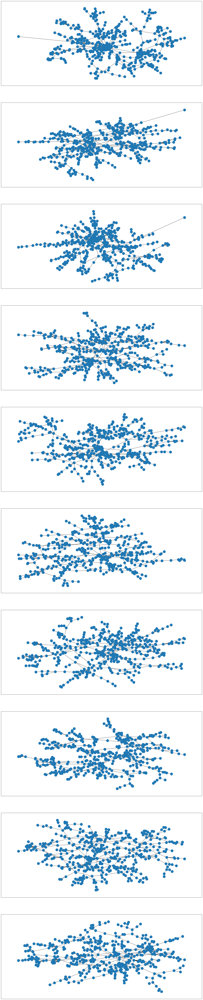

In [30]:
figure, axes = plt.subplots(10, 1, figsize=(24, 120))
nx.draw_networkx(graph_2011_filtered, with_labels=False, ax=axes[0])
nx.draw_networkx(graph_2012_filtered, with_labels=False, ax=axes[1])
nx.draw_networkx(graph_2013_filtered, with_labels=False, ax=axes[2])
nx.draw_networkx(graph_2014_filtered, with_labels=False, ax=axes[3])
nx.draw_networkx(graph_2015_filtered, with_labels=False, ax=axes[4])
nx.draw_networkx(graph_2016_filtered, with_labels=False, ax=axes[5])
nx.draw_networkx(graph_2017_filtered, with_labels=False, ax=axes[6])
nx.draw_networkx(graph_2018_filtered, with_labels=False, ax=axes[7])
nx.draw_networkx(graph_2019_filtered, with_labels=False, ax=axes[8])
nx.draw_networkx(graph_2020_filtered, with_labels=False, ax=axes[9])

On plotting the graphs, we see that the network looks different every year, and no two yearwise graphs look very similar. But that is just an opinion, let's see what the analysis is telling

## **Computing Graph Statistics over Time**

Instead of just an opinion, let's compute graph statistics over the time. We're computing the average shortest path by year this will tell us how spread apart our networks are.

In [31]:
average_degree_connectivity = []
average_shortest_path_length = []
year = [2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019, 2020]

for graph in [graph_2011_filtered, graph_2012_filtered, graph_2013_filtered, graph_2014_filtered, graph_2015_filtered,
             graph_2016_filtered, graph_2017_filtered, graph_2018_filtered, graph_2019_filtered, graph_2020_filtered]:
    average_shortest_path_length.append(nx.average_shortest_path_length(graph))

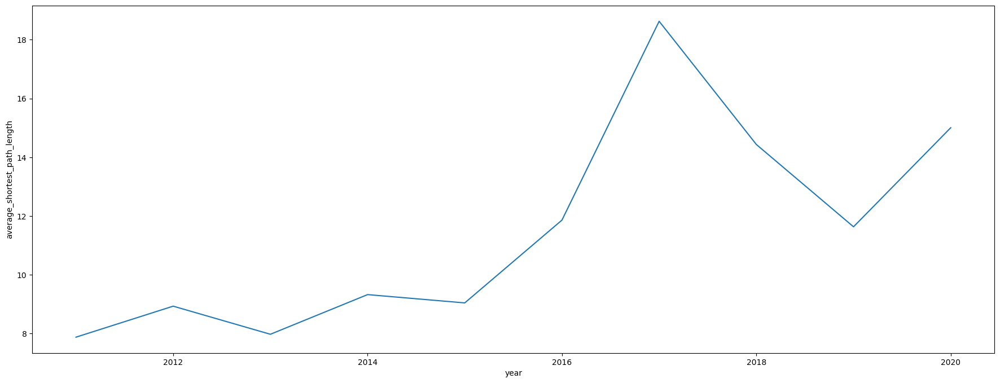

In [32]:
figure = plt.figure(figsize=(22, 8))
sns.lineplot(x='year', y='average_shortest_path_length',
             data=pd.DataFrame({'year': year, 'average_shortest_path_length': average_shortest_path_length}));

"Okay, cool line plot. But what does it mean?"  
I am here relax. A low average shortest path means that the network is more concentrated and thus, the stocks are close to each others.  

From the above plot we can see that the shortest path length was more stable till 2015 but there was significant increment in 2016 and 2017 and again there was a decrement in 2018. In 2020 there an increment again. May be this has some correlation with the financial queries.

A cool article about [Shortest path](https://medium.com/basecs/finding-the-shortest-path-with-a-little-help-from-dijkstra-613149fbdc8e)

## **Portfolio Construction**

We took a step back to explore how our dataset behaves year by year to truly understand what we’re dealing with before diving deeper.  
Alright, all this analysis was great. But now it’s time to take it a step further and actually build a portfolio that leverages what we’ve learned.
To do that, we’re now working with the full dataset.

In [33]:
# let's compute again log returns correlations but this time from 2011 to 2020 (on our entire scope)
# we are now using the entire dataset
log_returns_2011_till_2020 = np.log(price_data_cleaned.shift(1)) - np.log(price_data_cleaned)
return_correlation_2011_till_2020 = log_returns_2011_till_2020.corr()

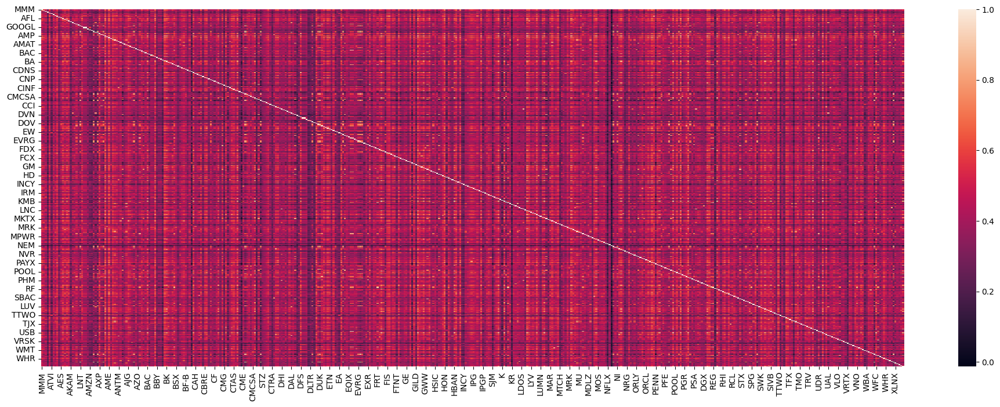

In [34]:
figure = plt.figure(figsize=(24, 8))
sns.heatmap(return_correlation_2011_till_2020);

In [35]:
distance_2011_till_2020 = np.sqrt(2 * (1 - return_correlation_2011_till_2020)) # compute the distance as before
distance_2011_till_2020_graph = nx.Graph(distance_2011_till_2020) # create the graph
distance_2011_till_2020_graph_filtered = nx.minimum_spanning_tree(distance_2011_till_2020_graph) # build the MST

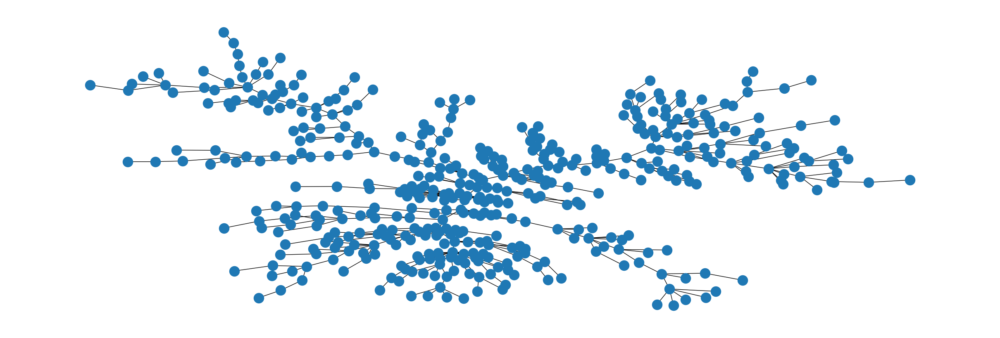

In [36]:
figure = plt.figure(figsize=(24, 8))
nx.draw_kamada_kawai(distance_2011_till_2020_graph_filtered, with_labels=False)

In [37]:
print(f"The entire filterd network has {distance_2011_till_2020_graph_filtered.number_of_nodes()} nodes and {distance_2011_till_2020_graph_filtered.number_of_edges()} edges.")

The entire filterd network has 450 nodes and 449 edges.


Okay great. Now things are getting serious. It's time for us to use some powerful measures when it comes to network analysis: **centrality measures**.  

A centrality measure is a measure that captures importance of a nodes position in the network.  

Imagine you're in a party, but instead of people, it's a room full of stocks. And instead of small talk, they’re connected based on how they are moving alike (their links in the network, don't forget)


 **Degree Centrality**: This measures how many direct friends (connections) a node has. Here a node is supposed to be more important if it is a high degree node (if it has more outgoing edges originating from it). A stock with high degree centrality is highly connected; it moves similarly with many other stocks.

**Eigenvector Centrality**: Not just being connected, but being connected to other important nodes. It’s recursive prestige.  

Here the importance of a node doesn't depend to its number of connections, but the importance of its connections. The intuition is that if the neighboring nodes are important the central node is also important.  
A stock with high eigenvector centrality may not have tons of links, but it's connected to stocks that themselves are well-connected. It’s like that VIP stock that influences the influencers.

**Closeness Centrality**: Measures how close a node is to all others, in terms of shortest paths.  
A stock with high closeness can quickly influence or be influenced by others. It's like a central hub in the stock ecosystem; sensitive to shocks and great at spreading them.

**Betweenness Centrality**: Counts how often a node appears on the shortest paths between other nodes.  
A stock with high betweenness might not be the most connected, but it acts as a bridge between stock clusters.  This action could spread panic or volatility to several sectors. For example, if this stock falls, other distant stock groups could also be indirectly impacted.

In [40]:
degree_centrality = nx.degree_centrality(distance_2011_till_2020_graph_filtered)
closeness_centrality = nx.closeness_centrality(distance_2011_till_2020_graph_filtered)
betweenness_centrality = nx.betweenness_centrality(distance_2011_till_2020_graph_filtered)
eigenvector_centrality=nx.eigenvector_centrality_numpy(distance_2011_till_2020_graph_filtered)

**Degree centrality per stock**

In [38]:
def plot_centrality(centrality_dict, centrality_name):
    # Convertir en DataFrame trié
    df = pd.DataFrame({
        'stocks': list(centrality_dict.keys()),
        centrality_name: list(centrality_dict.values())
    }).sort_values(centrality_name, ascending=False)

    plt.figure(figsize=(10, 5))
    sns.barplot(data=df, x='stocks', y=centrality_name, palette='viridis')
    plt.xticks(rotation=90)
    plt.title(f'{centrality_name.capitalize()} of Stocks', fontsize=14)
    plt.tight_layout()
    plt.show()

In [ ]:
keys = []
values = []

for key, value in degree_centrality.items():
    keys.append(key)
    values.append(value)

dc_data = pd.DataFrame({'stocks': keys, 'degree_centrality': values}).sort_values('degree_centrality', ascending=False)
px.bar(data_frame=dc_data, x='stocks', y='degree_centrality', template='plotly_dark')



Based on **Degree Centrality**, **HON (Honeywell) has the highest number of direct connections with other stocks**, and thus the **highest degree score**.
Remember, with Degree Centrality, stocks that are directly linked to many others tend to either influence or be influenced more rapidly by market movements.
HON makes a wide range of technologies and operates across various sectors, including airlines and retail. Its high degree centrality makes intuitive sense: it reflects the company’s exposure to many parts of the economy.
From a market perspective, one could consider investing in HON, since it's well-positioned to benefit from improvements in multiple industries simultaneously.

**Closeness centrality per stock**

In [ ]:
keys = []
values = []

for key, value in closeness_centrality.items():
    keys.append(key)
    values.append(value)

cc_data = pd.DataFrame({'stocks': keys, 'closeness_centrality': values}).sort_values('closeness_centrality',
                                                                                       ascending=False)
px.bar(data_frame=cc_data, x='stocks', y='closeness_centrality', template='plotly_dark')

**Closeness Centrality considers the shortest paths between all pairs of stocks in a network.**  
It reflects how quickly a stock can interact with or be influenced by the rest of the market.
**PRU (Prudential Financial)** has the highest closeness centrality, meaning it's, on average, very close to all other stocks in the network.
That makes sense, as financial service companies are deeply embedded in multiple sectors of the economy. Its strategic position may allow it to react quickly to shifts across the market.

**Betweenness centrality per stock**

In [ ]:
keys = []
values = []

for key, value in betweenness_centrality.items():
    keys.append(key)
    values.append(value)

bc_data = pd.DataFrame({'stocks': keys, 'betweenness_centrality': values}).sort_values('betweenness_centrality',
                                                                                       ascending=False)
px.bar(data_frame=bc_data, x='stocks', y='betweenness_centrality', template='plotly_dark')

**Betweenness Centrality captures how often a stock lies on the shortest path between pairs of other stocks, essentially, how often it serves as a bridge in the network.**  
**PRU** stands out once again, holding the highest betweenness centrality score. This suggests that it plays a critical role in connecting otherwise distant parts of the market.
When shocks ripple through the network, PRU is likely to either transmit or absorb a significant part of the impact.
Its central role highlights the systemic importance of financial institutions, which often act as conduits between sectors.
From a strategic standpoint, this could make PRU a key stock to watch during periods of market stress or transition.

**Eigenvector centrality per stock**

In [ ]:
keys = []
values = []

for key, value in eigenvector_centrality.items():
    keys.append(key)
    values.append(value)

dc_data = pd.DataFrame({'stocks': keys, 'eigenvector_centrality': values}).sort_values('eigenvector_centrality', ascending=False)
px.bar(data_frame=dc_data, x='stocks', y='eigenvector_centrality', template='plotly_dark')

**Eigenvector Centrality doesn’t just count how many connections a stock has, it also considers who it’s connected to**.  
A stock gains more influence if it's linked to other influential stocks.
In this case, **HON (Honeywell)** ranks highest in eigenvector centrality, indicating it's embedded within a highly interconnected and important part of the market network.
This reinforces what we saw with Degree Centrality: HON is not only well-connected, but it’s connected to other key players.
That gives it a position of strategic importance, a stock that doesn't just move with the market, but potentially helps shape its direction through its strong ties to influential sectors.

**That was a cool analysis right?** You can say no, it's okay, I can take it.  
We just used so centrality measures to spot stocks that are structurally important within the market. Whether you're seeking early movers, strategic bridges, or core influencers, centrality helps highlight positions of potential advantage.

In times of stability, the central stocks that we identified may thrive quietly. But in times of crisis or transition, they’re the ones to watch, because when the network shifts, it moves through them.

Taken together, these measures offer more than just abstract metrics. They provide a framework for identifying stocks that are structurally important within the market. Whether you're seeking early movers, strategic bridges, or core influencers, centrality helps highlight positions of potential advantage.

In times of stability, these central stocks may thrive quietly. But in times of crisis or transition, they’re the ones to watch, because when the network shifts, it moves through them.

## **Selecting Stocks based on Network Topological Parameters**

Now we’re computing network-based metrics to assess the importance of each stock in our market graph.  
We explore different approaches: degree centrality, betweenness centrality, stocks with the highest correlations, and those with the lowest average distance to others.  
From there, we’re building portfolios based on these structural indicators; with one simple goal in mind: **beating the S&P 500** (let's gooo).

In [ ]:
# we already computed degree centrality above

# we already computed betweenness centrality above

# nx.shortest_path_length() compute the shortest path between two nodes in the graph

# distance on degree criterion: based on degree (Ddegree)
distance_degree_criteria = {}
node_with_largest_degree_centrality = max(dict(degree_centrality), key=dict(degree_centrality).get)
for node in distance_2011_till_2020_graph_filtered.nodes():
    distance_degree_criteria[node] = nx.shortest_path_length(distance_2011_till_2020_graph_filtered, node,
                                                             node_with_largest_degree_centrality)

# distance on correlation criterion: based on correlations (Dcorrelation)
distance_correlation_criteria = {}
sum_correlation = {}

for node in distance_2011_till_2020_graph_filtered.nodes():
    neighbors = nx.neighbors(distance_2011_till_2020_graph_filtered, node)
    sum_correlation[node] = sum(return_correlation_2011_till_2020[node][neighbor] for neighbor in neighbors)

node_with_highest_correlation = max(sum_correlation, key=sum_correlation.get)

for node in distance_2011_till_2020_graph_filtered.nodes():
    distance_correlation_criteria[node] = nx.shortest_path_length(distance_2011_till_2020_graph_filtered, node,
                                                             node_with_highest_correlation)

# distance on distance criterion: based on mean distance (Ddistance)
distance_distance_criteria = {}
mean_distance = {}

for node in distance_2011_till_2020_graph_filtered.nodes():
    nodes = list(distance_2011_till_2020_graph_filtered.nodes())
    nodes.remove(node)
    distance_distance = [nx.shortest_path_length(distance_2011_till_2020_graph_filtered, node, ns) for ns in nodes]
    mean_distance[node] = np.mean(distance_distance)

node_with_minimum_mean_distance = min(mean_distance, key=mean_distance.get)

for node in distance_2011_till_2020_graph_filtered.nodes():
    distance_distance_criteria[node] = nx.shortest_path_length(distance_2011_till_2020_graph_filtered, node,
                                                             node_with_minimum_mean_distance)

Let me explain what we just did. The **distance here refers to the smallest length from a node to the central node of the network**.

Here, three types of definitions of central node are introduced to reduce the error caused by a single
method.

Therefore three types of distances are described here.

**1. Distance on degree criterion** (Ddegree), the central node is the one that has the largest degree.

**2. Distance on correlation criterion** (Dcorrelation), the central node is the one with the highest value of the sum of correlation coefficients with its neighbors.

**3. Distance on distance criterion** (Ddistance), the central node is the one that produces the lowest value for the mean distance.

In [ ]:
node_stats = pd.DataFrame.from_dict(dict(degree_centrality), orient='index')
node_stats.columns = ['degree_centrality']
node_stats['betweenness_centrality'] = betweenness_centrality.values()

# compute the average for centrality measures
node_stats['average_centrality'] = 0.5 * (node_stats['degree_centrality'] + node_stats['betweenness_centrality'])

# compute the distances and their average
node_stats['distance_degree_criteria'] = distance_degree_criteria.values()
node_stats['distance_correlation_criteria'] = distance_correlation_criteria.values()
node_stats['distance_distance_criteria'] = distance_distance_criteria.values()
node_stats['average_distance'] = (node_stats['distance_degree_criteria'] + node_stats['distance_correlation_criteria'] +
                                  node_stats['distance_distance_criteria']) / 3



In [ ]:
node_stats.head()

,degree_centrality,betweenness_centrality,average_centrality,distance_degree_criteria,distance_correlation_criteria,distance_distance_criteria,average_distance
MMM,0.002227,0.000000,0.001114,2,2,7,3.666667
AOS,0.004454,0.022073,0.013264,6,6,5,5.666667
ABT,0.008909,0.056584,0.032746,9,9,8,8.666667
ABMD,0.002227,0.000000,0.001114,10,10,9,9.666667
ACN,0.006682,0.008899,0.007790,16,16,9,13.666667


Now that we’ve defined our centrality metrics, it’s time to put them to use and start building some portfolios.

First, we select the top 10% of stocks based on **degree or betweenness centrality**. These are our central nodes, the stocks that are tightly connected or act as key bridges in the network.

On the flip side, the **peripheral portfolio** includes stocks with a degree of 1 or betweenness centrality of 0. In other words, those sitting on the outer edges of the network, less connected, less central.

We apply the same idea to average distances between stocks:

**Stocks with the lowest average distances (bottom 10%) are considered central**.

**Stocks with the highest average distances (top 10%) are considered peripheral**.

In short, we’re building two portfolios from opposite sides of the network:
central portfolios that hold structurally important stocks likely to influence the rest of the market,
and peripheral portfolios made of loosely connected stocks, often more volatile, more isolated, and less predictable.

Let’s see how these contrasting groups perform when we put them to the test.

In [ ]:
# for the central stocks, we take the top 15 stocks with the highest average centrality
central_stocks = node_stats.sort_values('average_centrality', ascending=False).head(15)
central_portfolio = [stock for stock in central_stocks.index.values]

In [ ]:
# for the peripheral stocks, we take the top 15 stocks with the highest average distance
peripheral_stocks = node_stats.sort_values('average_distance', ascending=False).head(15)
peripheral_portfolio = [stock for stock in peripheral_stocks.index.values]

In [ ]:
central_stocks.head()

,degree_centrality,betweenness_centrality,average_centrality,distance_degree_criteria,distance_correlation_criteria,distance_distance_criteria,average_distance
PRU,0.011136,0.639884,0.325510,7,7,0,4.666667
AMP,0.028953,0.540198,0.284576,5,5,2,4.000000
LNC,0.015590,0.526050,0.270820,6,6,1,4.333333
AME,0.020045,0.517430,0.268737,4,4,3,3.666667
GL,0.017817,0.452504,0.235160,8,8,1,5.666667


In [ ]:
peripheral_stocks.head()

,degree_centrality,betweenness_centrality,average_centrality,distance_degree_criteria,distance_correlation_criteria,distance_distance_criteria,average_distance
CHD,0.002227,0.000000,0.001114,24,24,17,21.666667
CLX,0.004454,0.004454,0.004454,23,23,16,20.666667
CAG,0.002227,0.000000,0.001114,23,23,16,20.666667
CPB,0.004454,0.004454,0.004454,22,22,15,19.666667
K,0.002227,0.000000,0.001114,22,22,15,19.666667


### **Selecting the top 15 stocks for both Central Stocks and Peripheral Stocks**

In [ ]:
color = []

for node in distance_2011_till_2020_graph_filtered:
    if node in central_portfolio:
        color.append('red')

    elif node in peripheral_portfolio:
        color.append('green')

    else:
        color.append('blue')

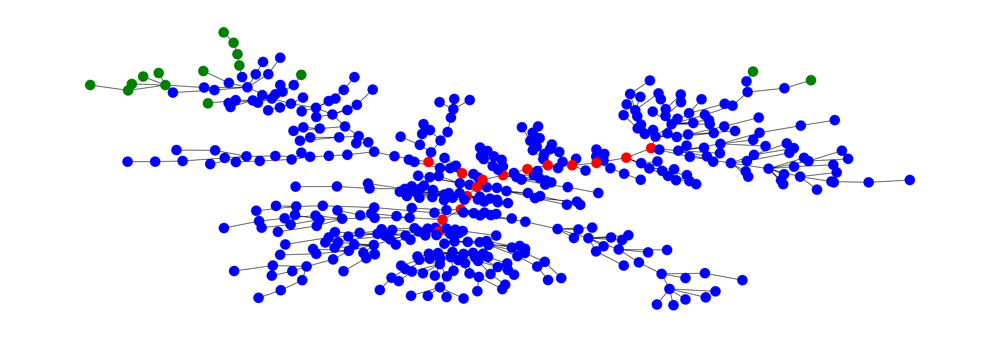

In [ ]:
figure = plt.figure(figsize=(24, 8))
nx.draw_kamada_kawai(distance_2011_till_2020_graph_filtered, with_labels=False, node_color=color)

Here, **the red stocks are the central portfolio stocks, and the green ones are the peripheral portfolio stocks.**

## **Performance Evalutation**

Finally!!!  
Let's now see if the portfolios that we made can be more interesting than the S&P 500. **Did we beat the finacial market?**  
Here we evaluate the performance of the stocks by comparing the performance of the Central Portfolio, Peripheral and S&P 500 Stocks in 2021, and **finding out which portfolio performs the best: it's a war without mercy.**

We are using the stocks prices for the following year, 2021, to evaluate our portfolios buit on the previous 10 years.

In [ ]:
price_data_2021 = pd.read_csv('snp500_price_data_2021.csv', index_col=[0])

In [ ]:
price_data_2021.head()

,MMM,AOS,ABT,ABBV,ABMD,ACN,ATVI,ADM,ADBE,ADP,...,WYNN,XEL,XLNX,XYL,YUM,ZBRA,ZBH,ZION,ZTS,CEG
Date,,,,,,,,,,,,,,,,,,,,,
2020-12-31,169.412521,53.700413,107.444366,101.195663,324.200012,257.353546,92.402596,49.218819,500.119995,172.915405,...,112.830002,64.846153,141.770004,100.827858,106.770256,384.329987,153.096832,42.901466,164.329178,NaN
2021-01-04,166.582382,52.818787,107.071472,99.552361,316.730011,252.673630,89.466812,48.691574,485.339996,165.810379,...,106.900002,63.863796,142.429993,98.747719,104.075439,378.130005,152.172821,42.397789,162.432663,NaN
2021-01-05,166.301315,53.161644,108.396248,100.581787,322.600006,254.112091,90.253006,49.638653,485.690002,165.349136,...,110.190002,63.241299,144.229996,98.628838,104.085266,380.570007,154.805740,43.069359,163.564590,NaN
2021-01-06,168.831009,54.993446,108.170555,99.712914,321.609985,256.890442,87.575966,51.649975,466.309998,164.770126,...,110.849998,64.641907,141.220001,102.789139,104.655716,394.820007,159.217133,47.908611,165.967484,NaN
2021-01-07,164.498520,55.669361,109.220566,100.780106,323.559998,259.314148,89.237915,51.191086,477.739990,165.702438,...,109.750000,63.377476,149.710007,107.454628,103.859055,409.100006,158.273254,49.370266,165.818558,NaN


Now we are getting the S&P 500 total values for the entire year 2021

In [ ]:
# it's possible to scrap them directly by using web from pandas_datareader.data
snp_500_2021 = web.DataReader(['sp500'], 'fred', start='2021-01-01', end='2021-12-31')

In [ ]:
price_data_2021.head()

,MMM,AOS,ABT,ABBV,ABMD,ACN,ATVI,ADM,ADBE,ADP,...,WYNN,XEL,XLNX,XYL,YUM,ZBRA,ZBH,ZION,ZTS,CEG
Date,,,,,,,,,,,,,,,,,,,,,
2020-12-31,169.412521,53.700413,107.444366,101.195663,324.200012,257.353546,92.402596,49.218819,500.119995,172.915405,...,112.830002,64.846153,141.770004,100.827858,106.770256,384.329987,153.096832,42.901466,164.329178,NaN
2021-01-04,166.582382,52.818787,107.071472,99.552361,316.730011,252.673630,89.466812,48.691574,485.339996,165.810379,...,106.900002,63.863796,142.429993,98.747719,104.075439,378.130005,152.172821,42.397789,162.432663,NaN
2021-01-05,166.301315,53.161644,108.396248,100.581787,322.600006,254.112091,90.253006,49.638653,485.690002,165.349136,...,110.190002,63.241299,144.229996,98.628838,104.085266,380.570007,154.805740,43.069359,163.564590,NaN
2021-01-06,168.831009,54.993446,108.170555,99.712914,321.609985,256.890442,87.575966,51.649975,466.309998,164.770126,...,110.849998,64.641907,141.220001,102.789139,104.655716,394.820007,159.217133,47.908611,165.967484,NaN
2021-01-07,164.498520,55.669361,109.220566,100.780106,323.559998,259.314148,89.237915,51.191086,477.739990,165.702438,...,109.750000,63.377476,149.710007,107.454628,103.859055,409.100006,158.273254,49.370266,165.818558,NaN


In [ ]:
# Removing NA values:
price_data_2021 = price_data_2021.dropna(axis=1)
snp_500_2021 = snp_500_2021.dropna()

In [ ]:
price_data_2021.head()

,MMM,AOS,ABT,ABBV,ABMD,ACN,ATVI,ADM,ADBE,ADP,...,WTW,WYNN,XEL,XLNX,XYL,YUM,ZBRA,ZBH,ZION,ZTS
Date,,,,,,,,,,,,,,,,,,,,,
2020-12-31,169.412521,53.700413,107.444366,101.195663,324.200012,257.353546,92.402596,49.218819,500.119995,172.915405,...,210.679993,112.830002,64.846153,141.770004,100.827858,106.770256,384.329987,153.096832,42.901466,164.329178
2021-01-04,166.582382,52.818787,107.071472,99.552361,316.730011,252.673630,89.466812,48.691574,485.339996,165.810379,...,203.699997,106.900002,63.863796,142.429993,98.747719,104.075439,378.130005,152.172821,42.397789,162.432663
2021-01-05,166.301315,53.161644,108.396248,100.581787,322.600006,254.112091,90.253006,49.638653,485.690002,165.349136,...,202.000000,110.190002,63.241299,144.229996,98.628838,104.085266,380.570007,154.805740,43.069359,163.564590
2021-01-06,168.831009,54.993446,108.170555,99.712914,321.609985,256.890442,87.575966,51.649975,466.309998,164.770126,...,203.699997,110.849998,64.641907,141.220001,102.789139,104.655716,394.820007,159.217133,47.908611,165.967484
2021-01-07,164.498520,55.669361,109.220566,100.780106,323.559998,259.314148,89.237915,51.191086,477.739990,165.702438,...,205.250000,109.750000,63.377476,149.710007,107.454628,103.859055,409.100006,158.273254,49.370266,165.818558


In [ ]:
snp_500_2021.head()

,sp500
DATE,
2021-01-04,3700.65
2021-01-05,3726.86
2021-01-06,3748.14
2021-01-07,3803.79
2021-01-08,3824.68


In [ ]:
price_data_2021 = price_data_2021['2021-01-04':]

Ready to risk it all? Take the 100,000 dollars and invest in each portfolio (chill it's just an integer in our program, not real money)

In [ ]:
amount = 100000 # the amount to invest

# === CENTRAL PORTFOLIO ===

# taking the central portfolio stocks prices for 2021
central_portfolio_value = pd.DataFrame()
for stock in central_portfolio:
    central_portfolio_value[stock] = price_data_2021[stock]

# Calculating the initial value of one unit of the central portfolio (i.e., sum of prices at t=0)
portfolio_unit = central_portfolio_value.sum(axis=1)[0]
# Calculating how many "units" we can buy with the investment amount
share = amount / portfolio_unit
# Computing the portfolio value over time by scaling the sum of daily stock prices
central_portfolio_value = central_portfolio_value.sum(axis=1) * share

# === PERIPHERAL PORTFOLIO ===

# Extracting the price data for the stocks in the peripheral portfolio (year 2021)
peripheral_portfolio_value = pd.DataFrame()
for stock in peripheral_portfolio:
    peripheral_portfolio_value[stock] = price_data_2021[stock]

# Calculating the initial value of one unit of the peripheral portfolio
portfolio_unit = peripheral_portfolio_value.sum(axis=1)[0]
# Number of units we can buy with the same investment amount
share = amount / portfolio_unit
# Computing the portfolio value over time
peripheral_portfolio_value = peripheral_portfolio_value.sum(axis=1) * share

In [ ]:
# Scaling the S&P 500 index to reflect the same investment amount
snp_500_2021_value = snp_500_2021 * (amount / snp_500_2021.iloc[0])

In [ ]:
central_portfolio

['PRU',
 'AMP',
 'LNC',
 'AME',
 'GL',
 'PH',
 'EMR',
 'TFC',
 'USB',
 'PNC',
 'JPM',
 'PFG',
 'BRK-B',
 'HST',
 'ADP']

In [ ]:
all_portfolios = snp_500_2021_value
all_portfolios['central_portfolio'] = central_portfolio_value.values
all_portfolios['peripheral_portfolio'] = peripheral_portfolio_value.values

In [ ]:
all_portfolios.head()

,sp500,central_portfolio,peripheral_portfolio
DATE,,,
2021-01-04,100000.000000,100000.000000,100000.000000
2021-01-05,100708.253955,100426.138652,100062.699137
2021-01-06,101283.288071,104249.598589,100581.162028
2021-01-07,102787.077946,105184.349194,100174.816809
2021-01-08,103351.573372,105127.033059,100190.990005


Let's plot the returns for each portfolio all together

Drumroll please!

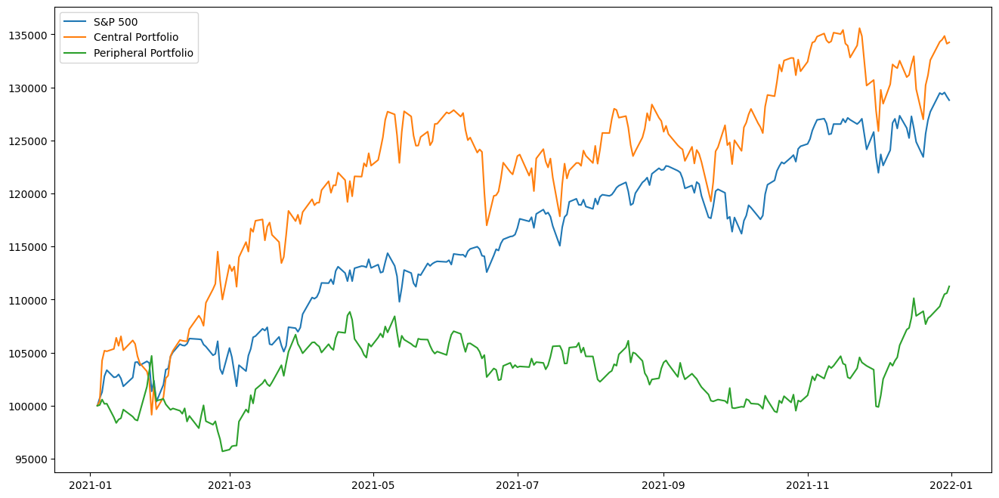

In [ ]:
figure, ax = plt.subplots(figsize=(16, 8))
snp_500_line = ax.plot(all_portfolios['sp500'], label='S&P 500')
central_portfolio_line = ax.plot(all_portfolios['central_portfolio'], label= 'Central Portfolio')
peripheral_portfolio_line = ax.plot(all_portfolios['peripheral_portfolio'], label= 'Peripheral Portfolio')
ax.legend(loc='upper left')
plt.show()

Before going further let's enjoy our victory first. We've beaten the jet2 holi... sorry, **we've beaten the S&P 500 index!!! Mission complete!**  

As we can see from the above plot, it is clear that **the Central Portfolio stocks perform better than the S&P 500 stocks in 2021.**   
On the other hand, the **Peripheral Portfolio stocks perform poorer in comparison to the S&P 500 stocks in 2021.**  

But! Don’t fall into the trap…

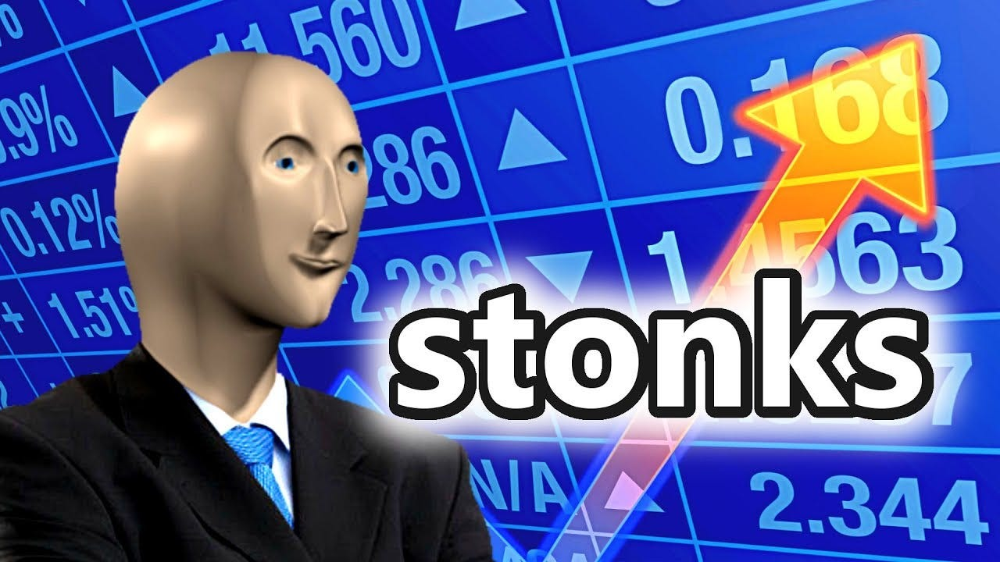

Both the portfolios have their own features under different market conditions.
   
**In calm and stable markets, central portfolio stocks tend to shine. They’re the big players, well-connected and riding the general market wave.**  
Think of companies like Apple, Microsoft, or JPMorgan: when things go well, everyone’s buying them, and they help pull the market up.  

But when **the market hits a storm (think COVID crash, or even sudden geopolitical shocks), peripheral stocks can actually do better.**  
Why? Because they’re loosely connected. Their prices don’t always move in sync with the rest of the market. They're like the weird cousin at the family dinner: not always predictable, but sometimes that’s exactly what saves them when chaos hits.

This is where **network analysis becomes powerful. It gives us a way to rebalance our portfolio based on how interconnected stocks are.**  

If you know where the fire might spread, you can choose whether to stay near the center... or take a step back toward the edge.

In [42]:
!jupyter nbconvert --to html AJP_Network_Stock_Portfolio_Optimization.ipynb

[NbConvertApp] Converting notebook AJP_Network_Stock_Portfolio_Optimization.ipynb to html
[NbConvertApp] WARNING | Alternative text is missing on 10 image(s).
[NbConvertApp] Writing 13222755 bytes to AJP_Network_Stock_Portfolio_Optimization.html
